# IMA207 - Practical work on SAR statistics

### Emanuele DALSASSO, Florence TUPIN, Cristiano ULONDU MENDES, Thomas BULTINGAIRE

### Statistics and despeckling

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

### Name: **Cristian CHÁVEZ**

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [4]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [5]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

## A. Single look data distributions

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

#### Single look data simulation

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

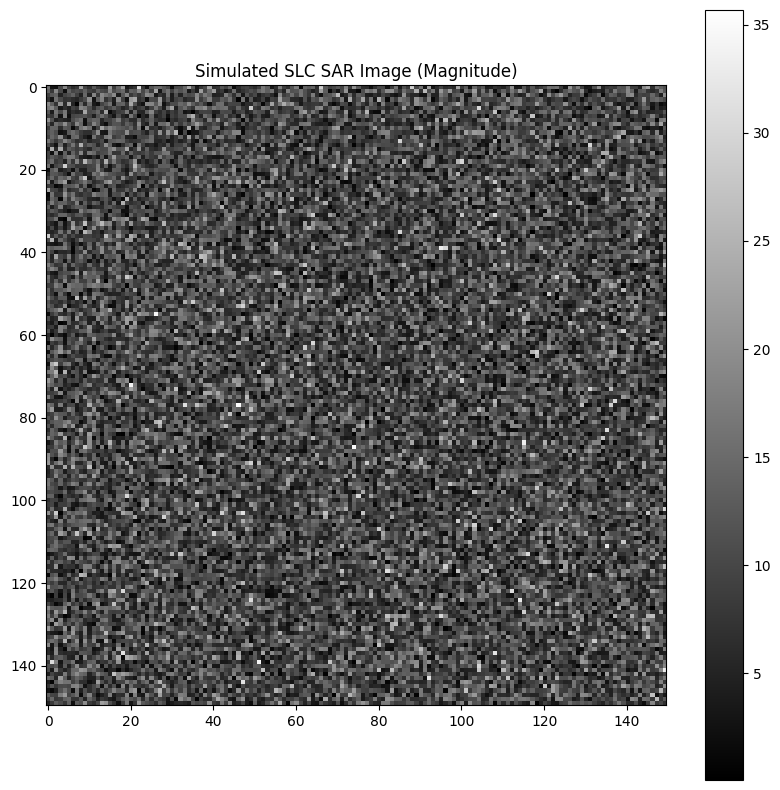

In [19]:
# Chose the reflectivity of the homogeneous area
#R = ... #complete

# Simulate the corresponding SLC image
#ima_slc = ... #complete
#mvalab.visusar(np.abs(ima_slc))
# Set the seed for reproducibility
np.random.seed(42)

# Chose the reflectivity of the homogeneous area
R = np.random.uniform(100, 200)

# Simulate the corresponding SLC image
size = (150, 150)
real_part = np.random.normal(loc=0, scale=np.sqrt(R / 2), size=size)
imag_part = np.random.normal(loc=0, scale=np.sqrt(R / 2), size=size)
ima_slc = real_part + 1j * imag_part

# Visualize the magnitude of the SLC image
plt.figure(figsize=(10, 10))
plt.imshow(np.abs(ima_slc), cmap='gray')
plt.title('Simulated SLC SAR Image (Magnitude)')
plt.colorbar()
plt.show()

#### Data distributions for an homogeneous area

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [20]:
# Compute the intensity and the phase
#ima_int = ... #complete
#ima_ph = ... #complete
# Compute the intensity and phase
ima_int = np.abs(ima_slc)**2
ima_ph = np.angle(ima_slc)


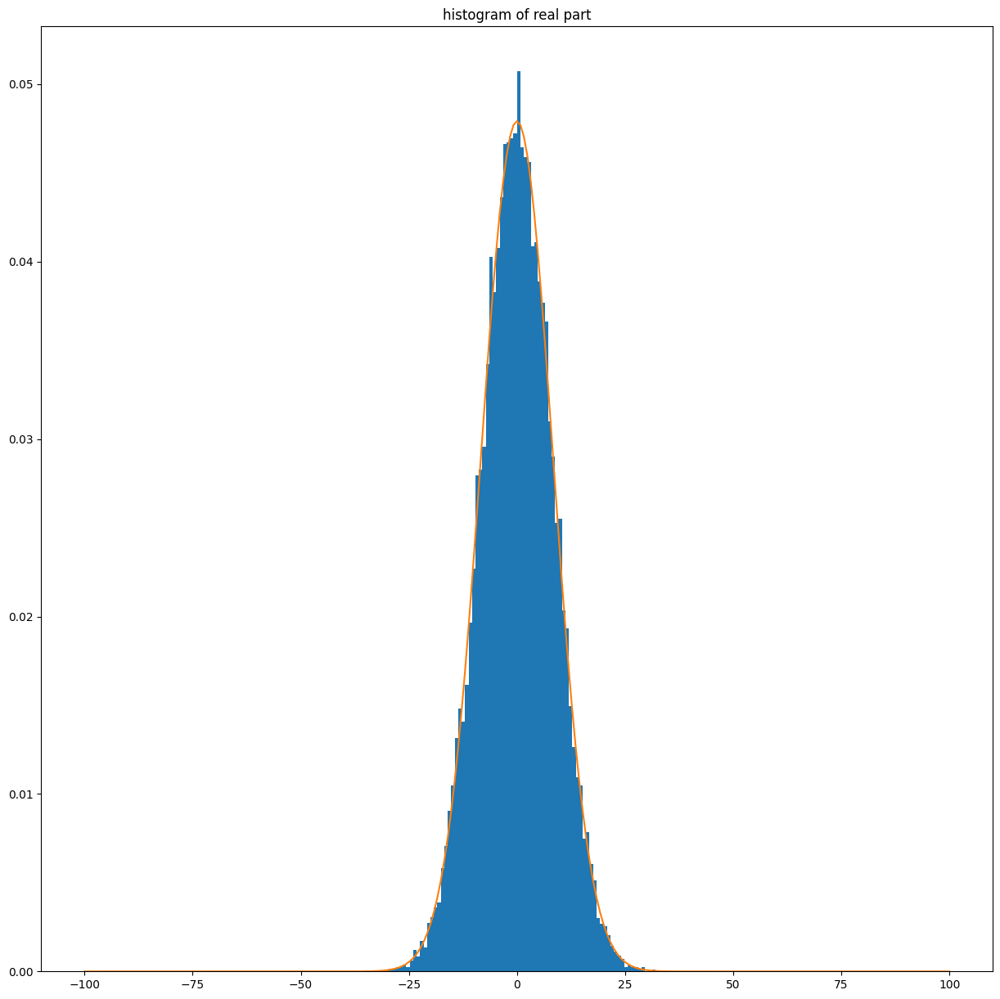

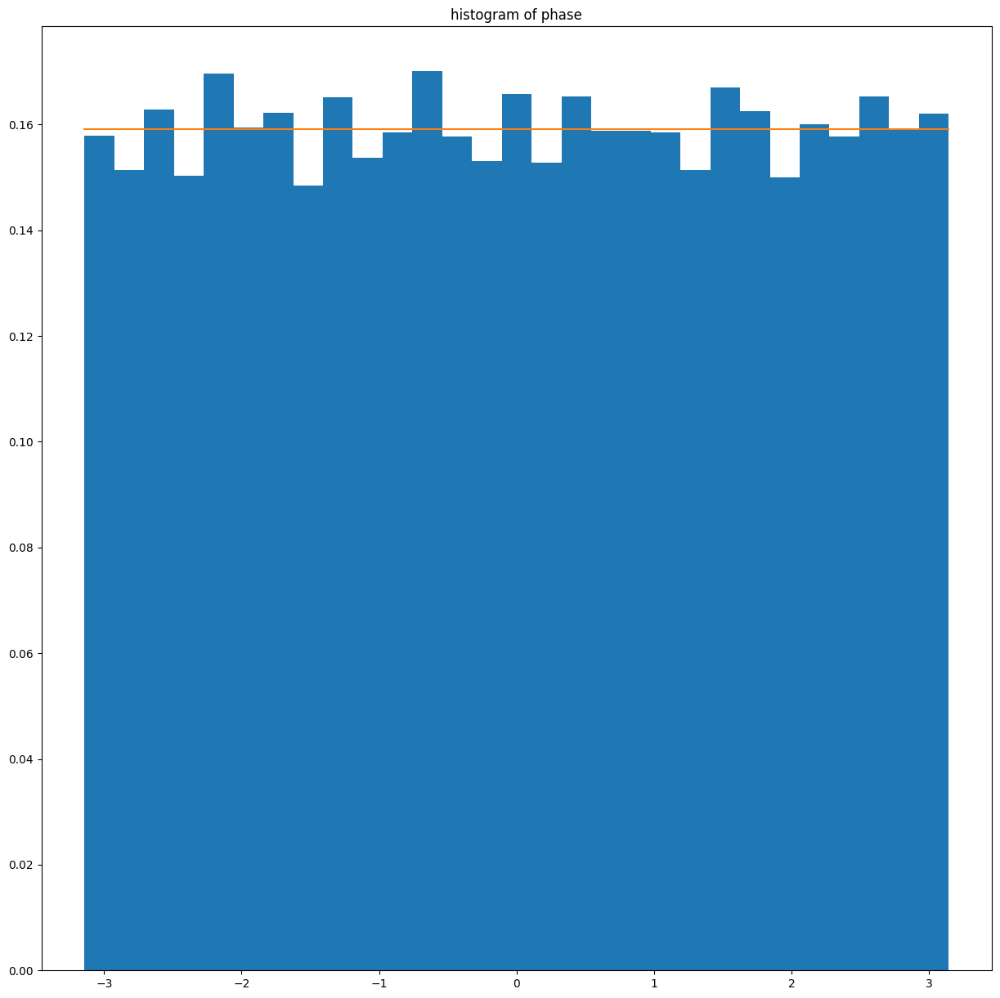

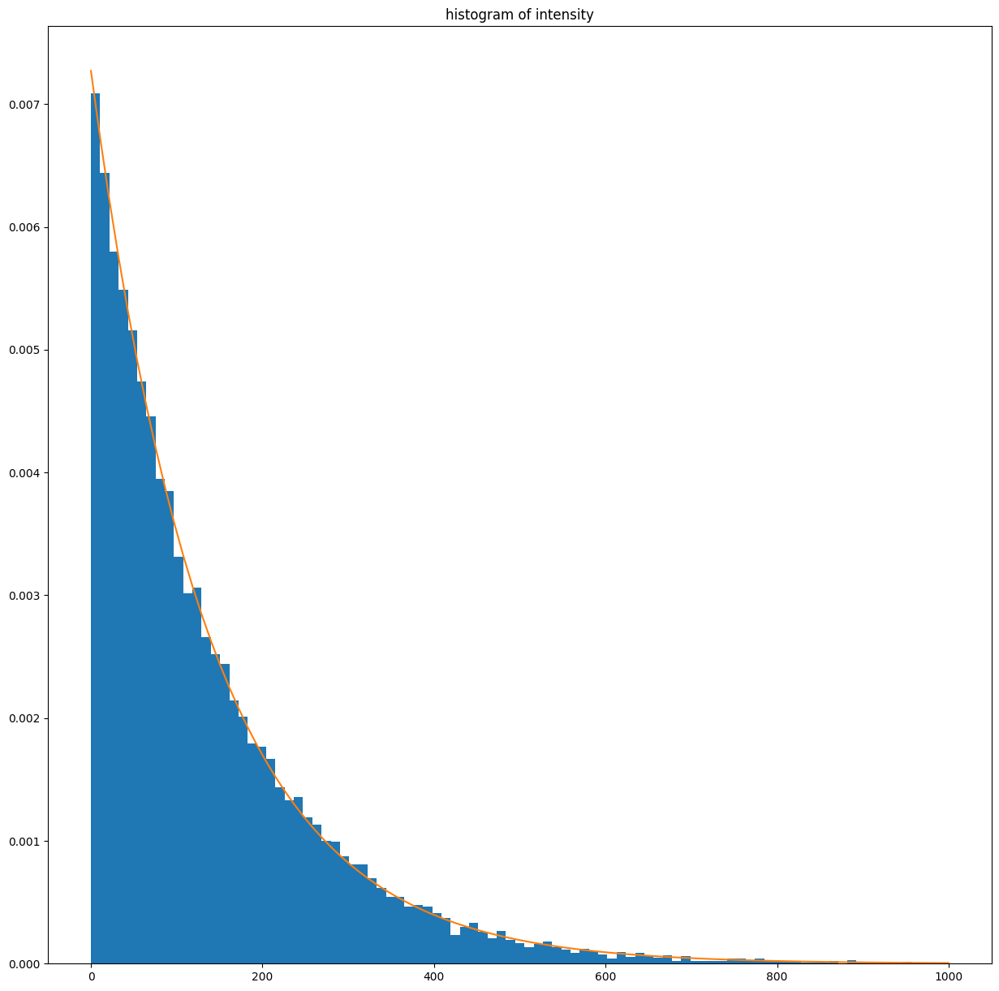

In [21]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Gaussian pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data
plt.figure()
_, bins, _ = plt.hist(np.real(ima_slc).ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()


#complete for phase data: Uniform distribution
plt.figure()
_, bins, _ = plt.hist(ima_ph.ravel(), bins='auto', density=True, range=[-np.pi, np.pi])
best_fit_line = scipy.stats.uniform.pdf(bins, loc=-np.pi, scale=2*np.pi) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist(ima_int.ravel(), bins='auto', density=True, range=[0, 1000])
loc, scale = scipy.stats.expon.fit(ima_int.ravel(), floc=0)  # Fix location to 0 for exponential fit
best_fit_line = scipy.stats.expon.pdf(bins, loc, scale) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of intensity')
plt.show()

In [22]:
# Compute the coefficient of variation on the homogeneous area in intensity

m_I = np.mean(ima_int) #complete
sigma_I = np.std(ima_int) #complete
coeff_var_I = sigma_I/m_I
print(coeff_var_I)

0.990506177898743


### Question A.1.

Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

### Answer A.1.

Yes, they show the distributions seen in the course since:
-   The real part of the image should follows a Gaussian distribution: $p(\text{Re}(z) | \sigma) = \frac{1}{\sqrt{2\pi}\sigma} \exp(-\frac{\text{Re}(z)^2}{2\sigma^2}) \rightarrow p(\text{Re}(z) | R) = \frac{1}{\sqrt{\pi R}} \exp(-\frac{\text{Re}(z)^2}{R})$
-   The phase of the image should follows a uniform distribution between $[-\pi,\pi]$
-   The intensity of the image follows an exponential distribution: $p(I | R) = \frac{1}{R}\exp(-\frac{I}{R})$

The formula of the coefficient of variation is

$$
\gamma_I = \frac{\sigma_I}{\mathbf{E}[I]} = \frac{R}{R} = 1
$$

We found the correct values since is close to 1. It could be less than 1 since we're dealing with estimators of random variables and thus a certain degree of randomness is expected.


## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images of a part a ocean (São-Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [52]:
# Download the images
!wget "https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy"
!wget "https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy"

--2024-06-05 16:12:28--  https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2,0M) [application/octet-stream]
Saving to: ‘s1_grd_saopaulo.npy.2’

s1_grd_saopaulo.npy 100%[===================>]   2,00M  6,09MB/s    in 0,3s    

2024-06-05 16:12:28 (6,09 MB/s) - ‘s1_grd_saopaulo.npy.2’ saved [2097280/2097280]

--2024-06-05 16:12:29--  https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2,0M) [application/octet-stream]
Saving to: ‘tsx_grd_bologne.npy.2’

tsx_grd_bologne.npy 100%[===================>]   2,00M  6,23MB/s    in 0,3s    

202

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


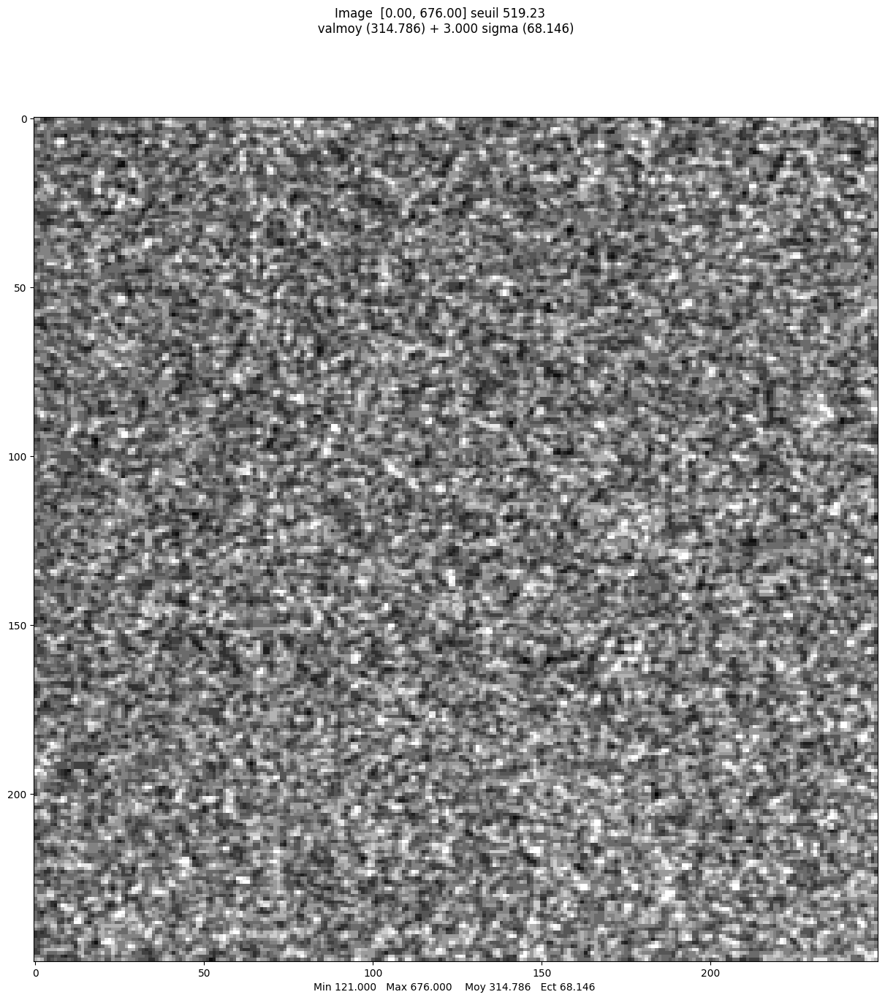

--- coeff var and L ---
coefficient of variation: 0.21648477
ENL: 21.33758686719461


In [25]:
im_s1grd = np.load("s1_grd_saopaulo.npy").astype(np.float32) #amplitude
im_s1grd = im_s1grd**2 # intensity
im_s1grd_mer = im_s1grd[50:300, 100:350]
mvalab.visusar(np.abs(im_s1grd_mer))
#mvalab.visusar(im_s1grd)

# compute coefficient of variation and number of looks
mean_int_s1grd = np.mean(im_s1grd_mer)
std_int_s1grd = np.std(im_s1grd_mer)
coeff_var_grd = std_int_s1grd / mean_int_s1grd
L_grd = 1 / (coeff_var_grd**2)
#coeff_var_grd = ... #complete
#L_grd = ... #complete
print('--- coeff var and L ---')
print('coefficient of variation: '+ str(coeff_var_grd))
print('ENL: ' + str(L_grd))

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


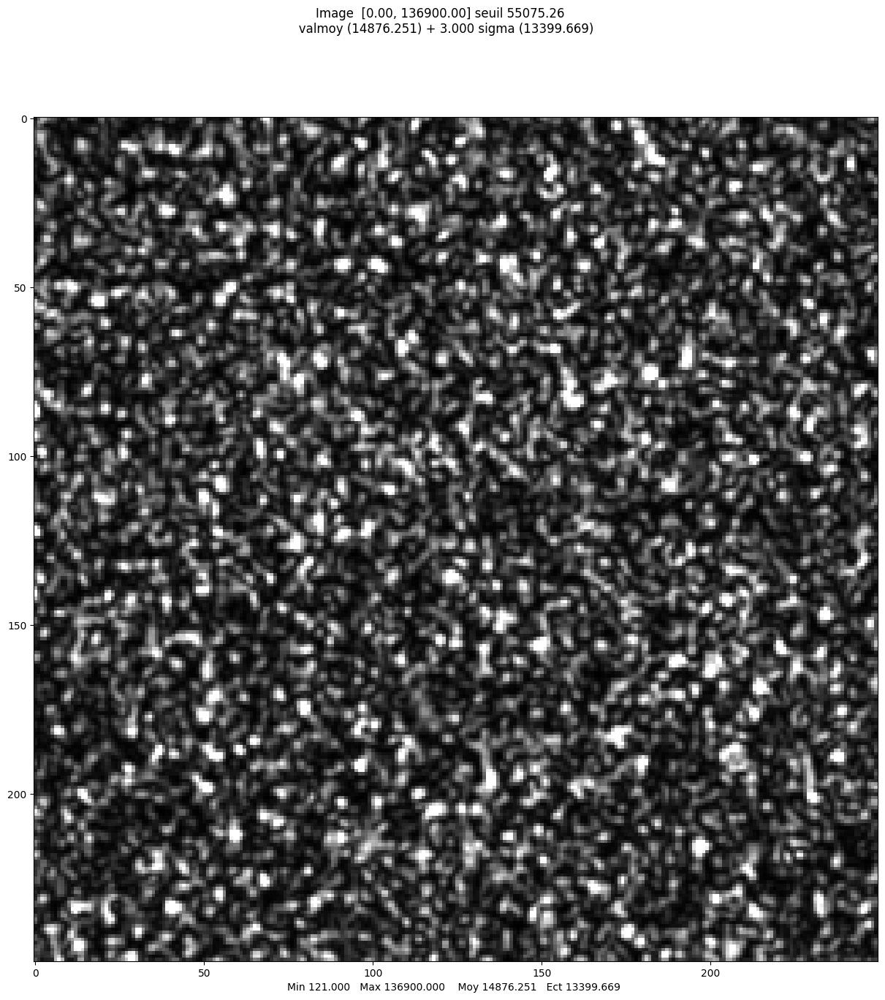

--- TerraSAR-X GRD ---
Coefficient of Variation: 0.90074235
Equivalent Number of Looks (ENL): 1.2325337872691504


In [26]:
im_tsxgrd = np.load("tsx_grd_bologne.npy").astype(np.float32) #amplitude
im_tsxgrd = im_tsxgrd**2 # intensity
im_tsxgrd_champ = im_tsxgrd[700:950, 300:550]
mvalab.visusar(np.abs(im_tsxgrd_champ))

# compute coefficient of variation and number of looks
mean_int_tsxgrd = np.mean(im_tsxgrd_champ)
std_int_tsxgrd = np.std(im_tsxgrd_champ)
coeff_var_tsxgrd = std_int_tsxgrd / mean_int_tsxgrd
L_tsxgrd = 1 / (coeff_var_tsxgrd**2)

print('--- TerraSAR-X GRD ---')
print('Coefficient of Variation:', coeff_var_tsxgrd)
print('Equivalent Number of Looks (ENL):', L_tsxgrd)

### Question B.1
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

### Answer B.1

The estimated number of looks is about 21.3375 and 1.2325 for the Sentinel-1 image and the TerraSAR-X image respectively. These values are not whole numbers since the samples to do the multi-looking are not i.i.d. In this case, the "number of looks" will be less than announced and no more an integer value.

## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution.

In [55]:
# Download the image
!wget "https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy"

--2024-06-05 16:12:31--  https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8,0M) [application/octet-stream]
Saving to: ‘tsx_slc_rome.npy.2’

tsx_slc_rome.npy.2  100%[===================>]   8,00M  6,17MB/s    in 1,3s    

2024-06-05 16:12:32 (6,17 MB/s) - ‘tsx_slc_rome.npy.2’ saved [8388736/8388736]



Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


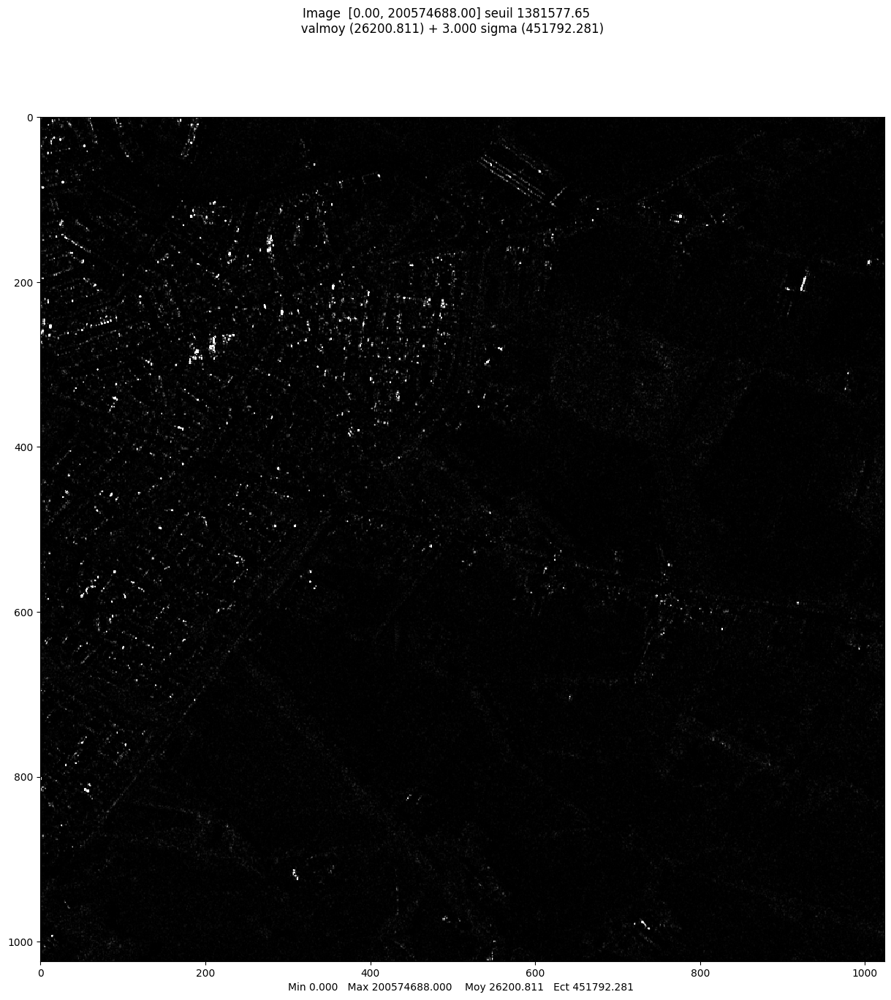

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


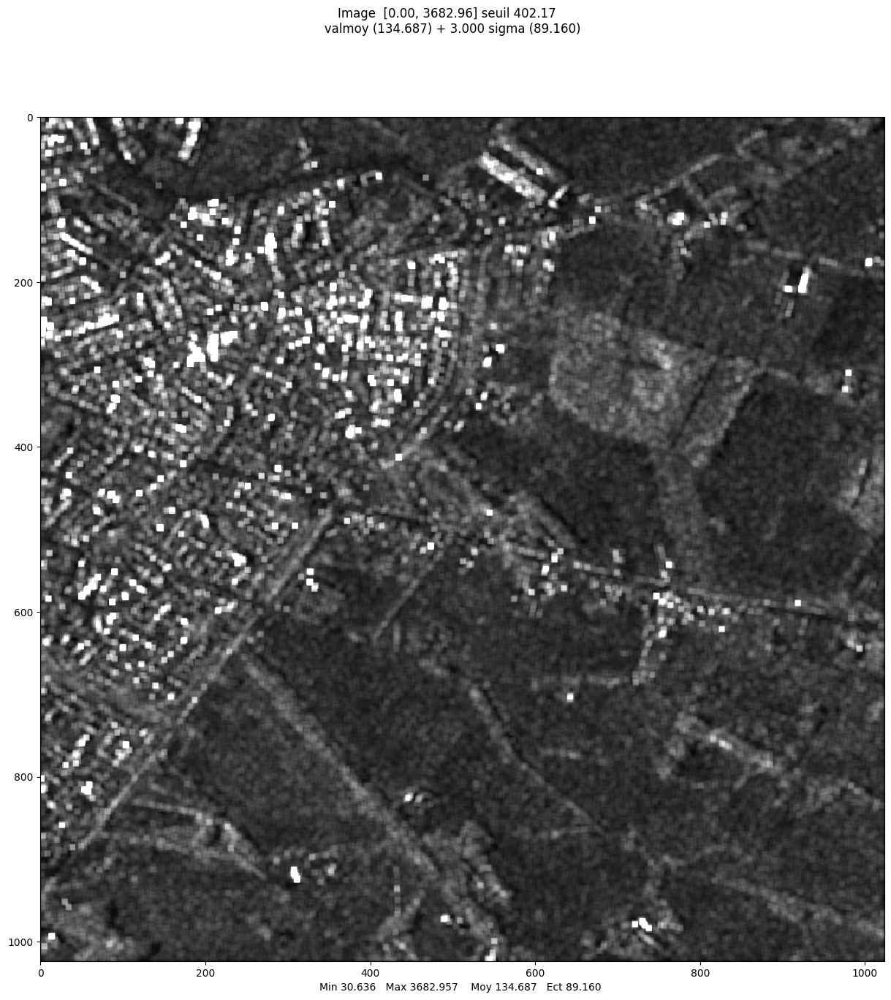

array([[183.89244046, 184.48566411, 186.99863867, ...,  61.63255154,
         44.48939344,  35.15708231],
       [189.93054822, 190.60403683, 194.01735886, ...,  63.91352539,
         47.27859226,  37.94544967],
       [202.09873562, 203.35181371, 207.2893593 , ...,  67.95842025,
         52.45172678,  40.45859557],
       ...,
       [ 62.98461133,  67.20058338,  72.20534824, ...,  90.00804967,
         85.4055157 ,  78.58480441],
       [ 54.6515867 ,  59.24456416,  61.89210498, ...,  78.87887928,
         74.6182124 ,  70.08828292],
       [ 52.25174548,  56.38986021,  58.61757762, ...,  66.7677979 ,
         62.76129132,  57.7817858 ]])

In [32]:
ima_tsxslc = np.load("tsx_slc_rome.npy") #amplitude

# take the intensity
ima_int = np.abs(ima_tsxslc)**2 #complete
mvalab.visusar(ima_int)

# create the average window
size_window = 7
mask_loc = np.ones((size_window, size_window)) / (size_window**2) #complete

# compute the mean image (intensity data)
ima_int_mean = scipy.signal.convolve2d(ima_int, mask_loc, mode='same') #complete

ima_amp_mean = np.sqrt(ima_int_mean)

# display the result
mvalab.visusar(ima_amp_mean)

### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?

### Answer C.1


The mean filter is effective in lowering variance in areas that are physically homogeneous however, it also reduces variance in physically heterogeneous areas, leading to a loss of important information in some regions of the image (the details, like contrasts or texturs). A larger window size intensifies this effect, causing more significant loss of borders and textures and making the image in general smoother.

## C.2 Lee filter

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image), and $\hat{\gamma}_s$ is the empirical value of the coefficient of variation for the given neighborhood.
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look image, compute the Lee filter on the intensity image of "ima_tsxslc"

local mean image
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


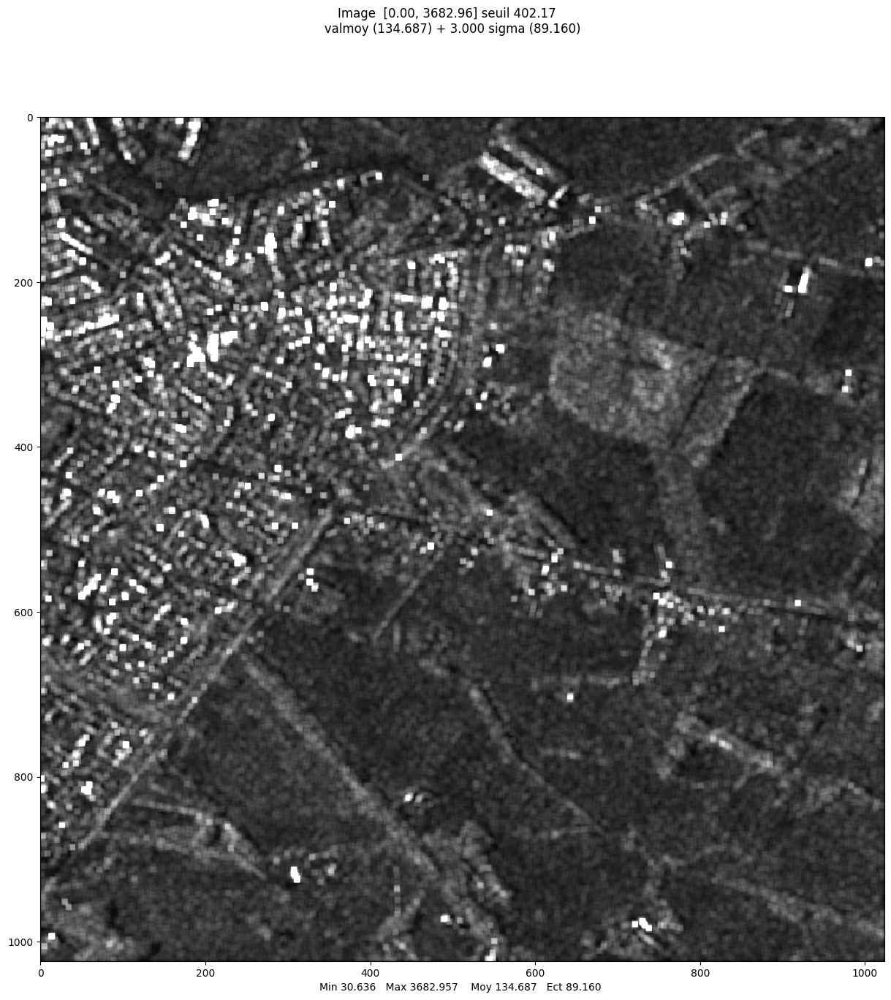

local variance image
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


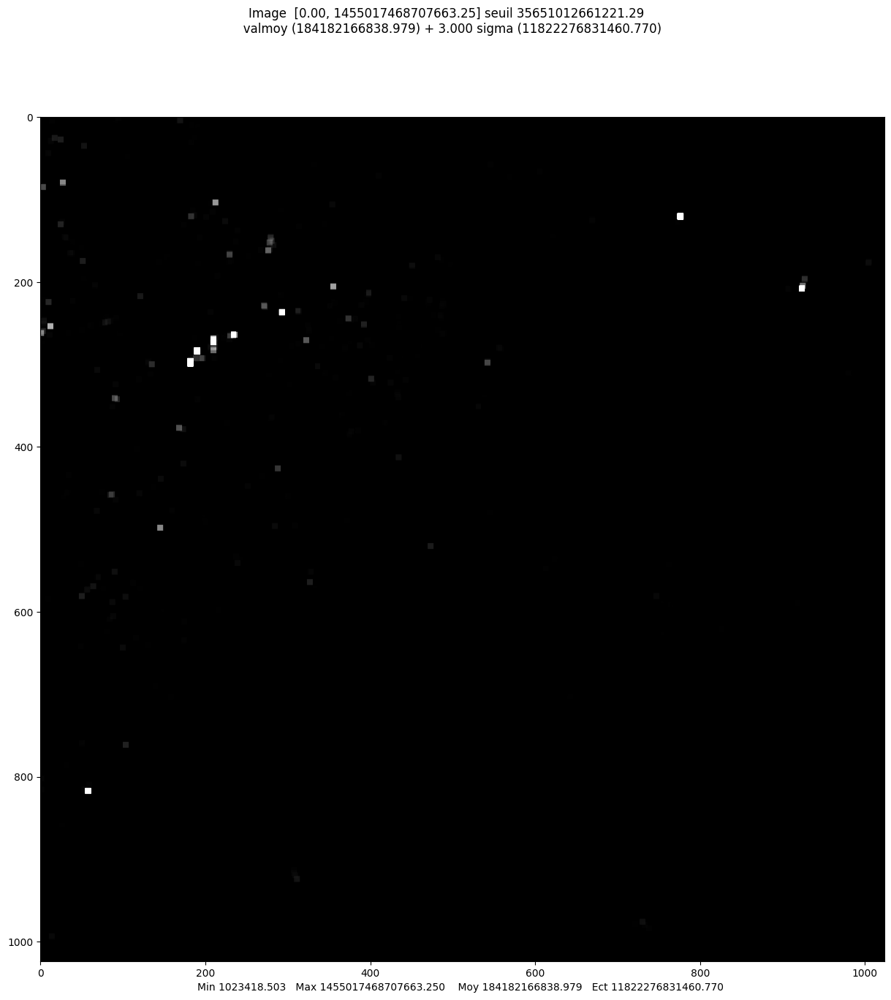

local coefficient of variation image
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


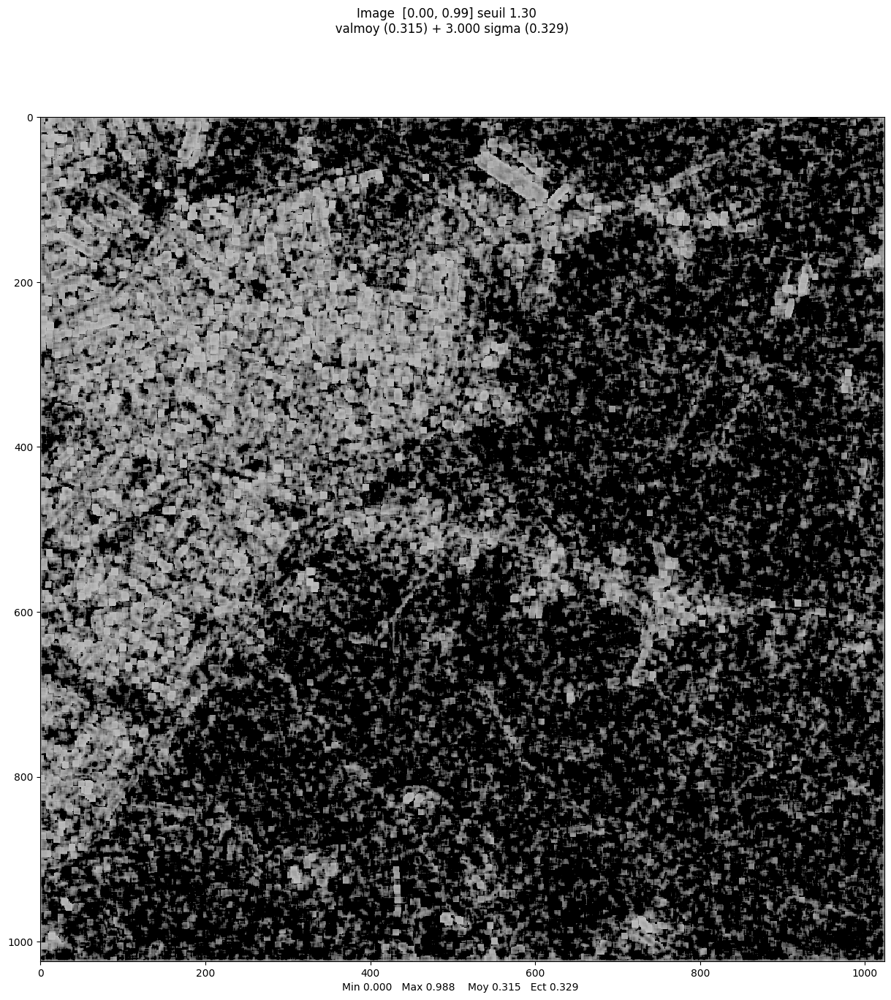

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


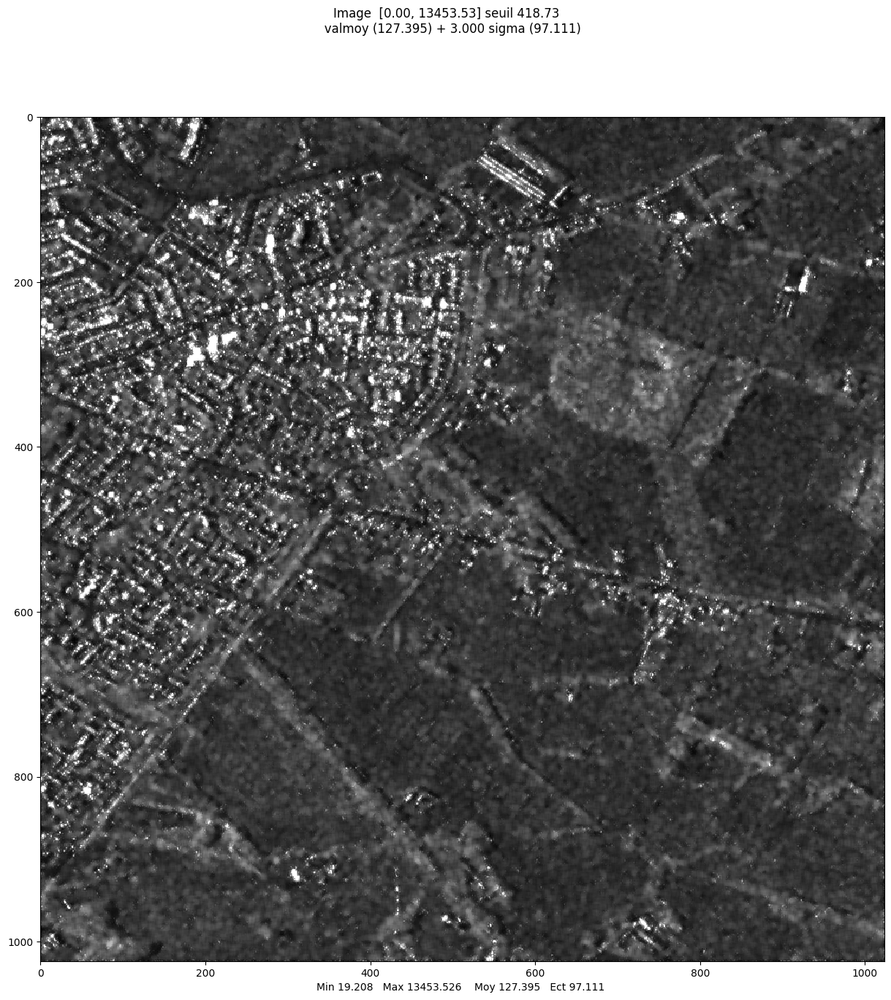

array([[144.00413727, 308.36183233, 418.7286652 , ...,  64.55605282,
         86.24329446, 112.81753373],
       [190.04858887, 418.7286652 , 418.7286652 , ...,  43.61261524,
         65.84179832,  29.56000307],
       [234.64043021, 418.7286652 , 351.03721453, ...,  50.61296111,
         32.24712371,  28.44227807],
       ...,
       [ 84.26142301,  75.181164  ,  71.41213092, ..., 120.50446688,
         99.10429479,  51.0522139 ],
       [ 77.25169039,  93.77458808,  77.26014126, ...,  98.28983025,
         70.83758473, 106.03256301],
       [ 53.89435933,  56.73688736,  91.1884864 , ...,  93.50540263,
         48.2759747 , 115.68994217]])

In [34]:
def lee_filter(im, neighborhood=7, L=1, visualize=False):

  # Mask
  mask = np.ones((neighborhood, neighborhood)) / (neighborhood**2) #complete

  # Compute local mean image
  im_mean = scipy.signal.convolve2d(im, mask, mode='same') #complete

  # Compute local coefficient of variation (thanks to local variance and local mean)
  im_var = scipy.signal.convolve2d(im**2, mask, mode='same') - im_mean**2#complete
  gamma_sp = 1 / np.sqrt(L)
  coeff_var_emp = np.sqrt(im_var) / im_mean
  ks = 1 - (gamma_sp**2 / (coeff_var_emp**2 + 1e-10)) #complete
  ks = np.clip(ks, 0, 1)

  # Compute Lee filter
  filtered_im = im_mean + ks * (im - im_mean) #complete

  # Visualizations
  if visualize:
    print("local mean image")
    mvalab.visusar(np.sqrt(im_mean))
    print("local variance image")
    mvalab.visusar(im_var)
    print("local coefficient of variation image")
    mvalab.visusar(np.sqrt(ks))

  return filtered_im


lee_filtered_int = lee_filter(ima_int, neighborhood=7, L=1, visualize=True) #complete
lee_filtered = np.sqrt(lee_filtered_int)
mvalab.visusar(lee_filtered)

### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

### Answer C.2

The local standard deviation is proportional to local reflectivity, meaning it doesn't measure local heterogeneity as it would in an optical image. However, by normalizing with the local mean, we get the coefficient of variation, which better indicates which parts of an image are physically homogeneous and which are more heterogeneous. The Lee filter uses this information to determine which areas of the image can be safely averaged and which areas should be preserved.

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.


### Answer C.3

The Lee filter is significantly less aggressive than the mean filter, better preserving the borders in the image while still averaging constant areas. A smaller window size results in less averaging over large areas and better border preservation, but also removes less noise.

## Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

## C.4 Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR and compare visually the result with the image filtered using the Lee filter.
  

In [36]:
# Download the image
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

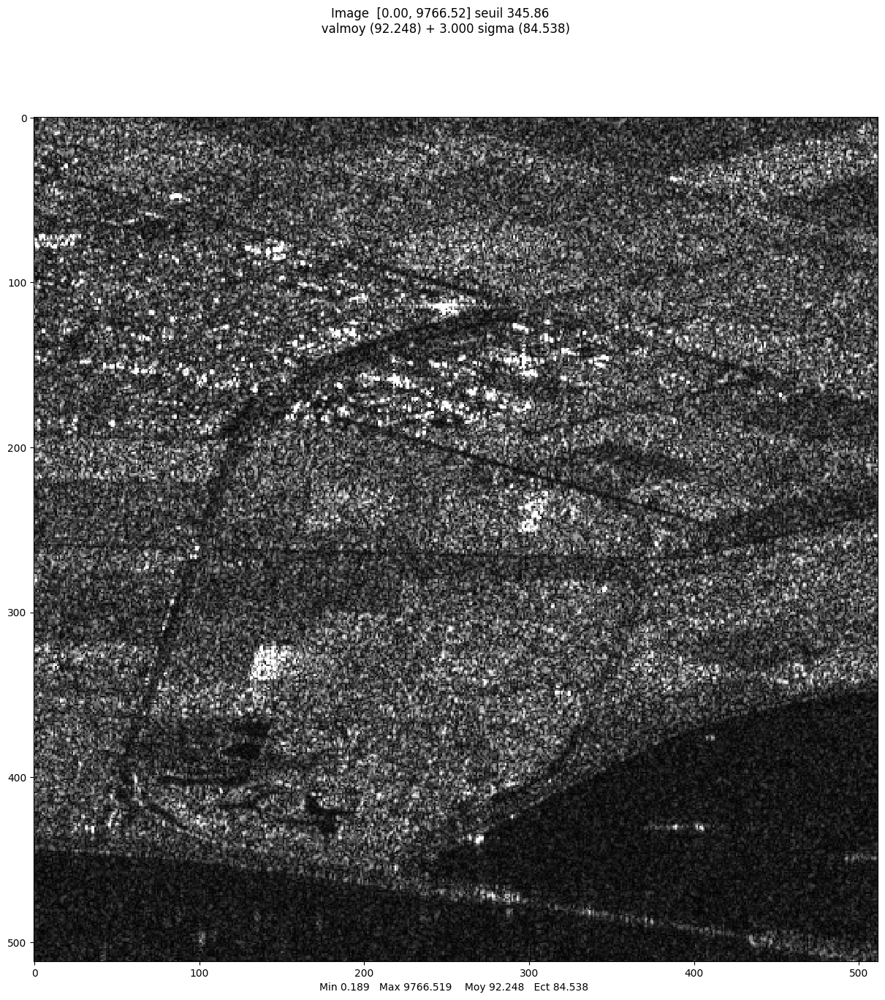

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


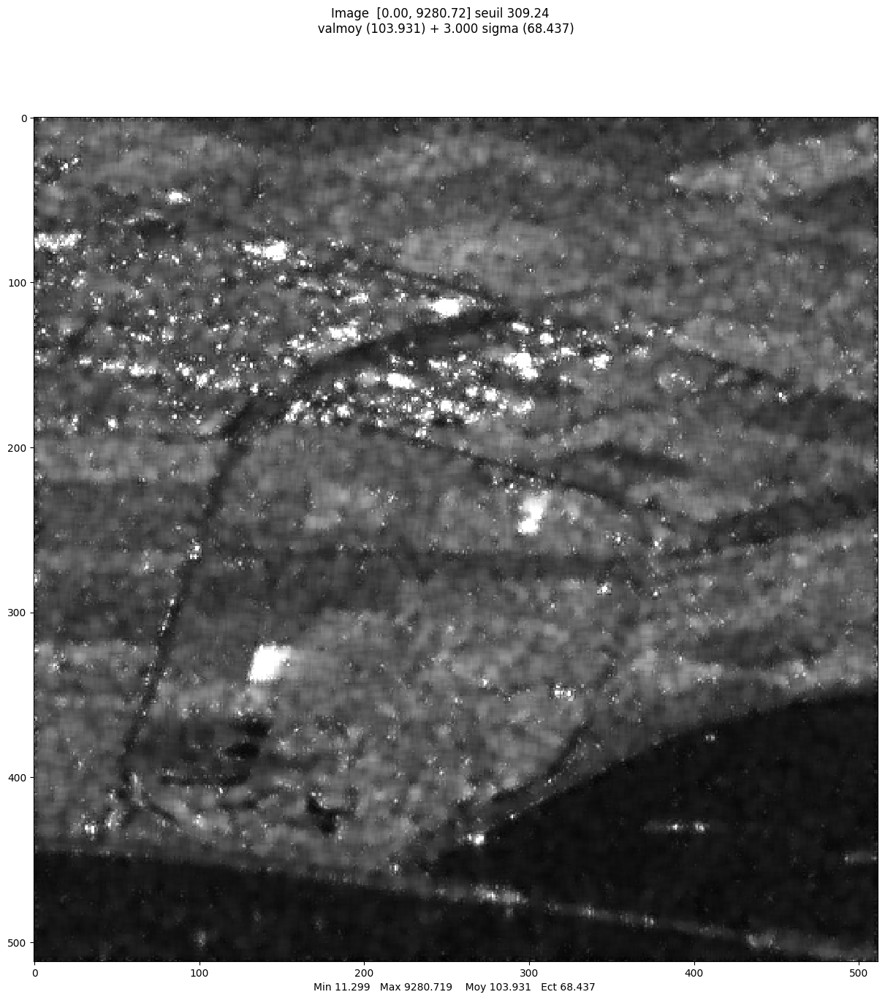

array([[ 77.42145081,  60.57726231,  83.83170578, ...,  43.65446769,
         42.33217855,  46.88156881],
       [ 47.869043  ,  52.86934886,  52.8235984 , ..., 120.65639836,
         90.12296035,  41.31860317],
       [ 56.93129422,  82.0020663 ,  74.30037708, ..., 110.16119263,
        116.76405434,  75.10916861],
       ...,
       [ 29.19809719,  31.70052529,  28.58914586, ...,  73.17288733,
         51.27087521,  62.14106404],
       [ 19.47862472,  31.21831959,  34.60554861, ...,  76.36410083,
         55.47956716,  73.65145118],
       [ 24.60171053,  44.89194795,  19.98769651, ...,  76.06644646,
         35.93479203, 101.22668942]])

In [42]:
part_lely_slc = mvalab.imz2mat('lely_tuple_multitemp.IMA')[0] #date is on thrid axis of part_lely_slc
part_lely_slc = part_lely_slc[:,:,0] #single look complex image
# Display the original SLC image
mvalab.visusar(np.abs(part_lely_slc))

# Convert to intensity
part_lely_int = np.abs(part_lely_slc)**2
# using your previous code, filter the image part_lely_int with the Lee filter
# Apply the Lee filter to the intensity image
lee_filtered_int = lee_filter(part_lely_int, neighborhood=7, L=1, visualize=False)

# Display the Lee filtered intensity image
mvalab.visusar(np.sqrt(lee_filtered_int))

"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp_SAR2SAR.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type FLOAT
lecture de  lely_tuple_multitemp_SAR2SAR.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 0 blocksize 1048576
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 6/25
Données réelles. Nouvell

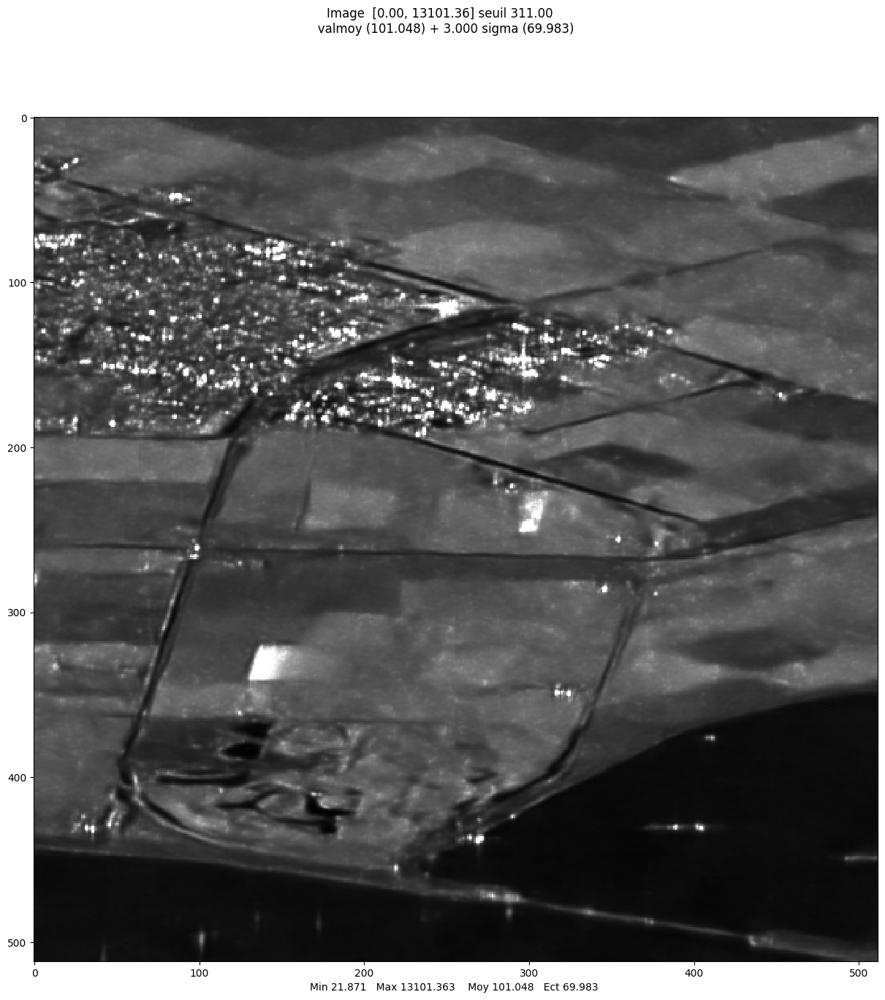

array([[108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       ...,
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166]])

In [43]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
im_lely_multitemp_denoised = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,0]) #amplitude
# Display the SAR2SAR denoised image
mvalab.visusar(im1_d)

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

The CNN filtering is better, preserving better edges and averaging homogeneous areas more consistently than the Lee filter, also this method shows less artifcats. 

This better performance is expected, since the Lee filter is a very simple filter (basically a linear combination of the original image and a mean filter), when compared to a deep CNN.

## C.5 Method noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question C.5
Compute the aforementioned ratio image, mean value and variance for the image restored using the Lee filter and the result of SAR2SAR. Comment the results.

What is the interest of computing the method noise ? What are your conclusions for the two previous filters ?

### Answer C.5

The goal of calculating method noise is to identify areas where the denoising algorithm might have over-smoothed (removed important details) or under-smoothed (left residual noise) the image. Ideally, both methods should have a mean ratio close to 1, indicating that overall intensity levels are maintained. The variance of the ratio image should be close to 1/L; lower variance may suggest over-smoothing (loss of details), while higher variance may suggest under-smoothing (remaining noise).

SAR2SAR performs significantly better in terms of variance, indicating it over-smooths less. This conclusion is also supported qualitatively, as line patterns are visible in the Lee image ratio plot.

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


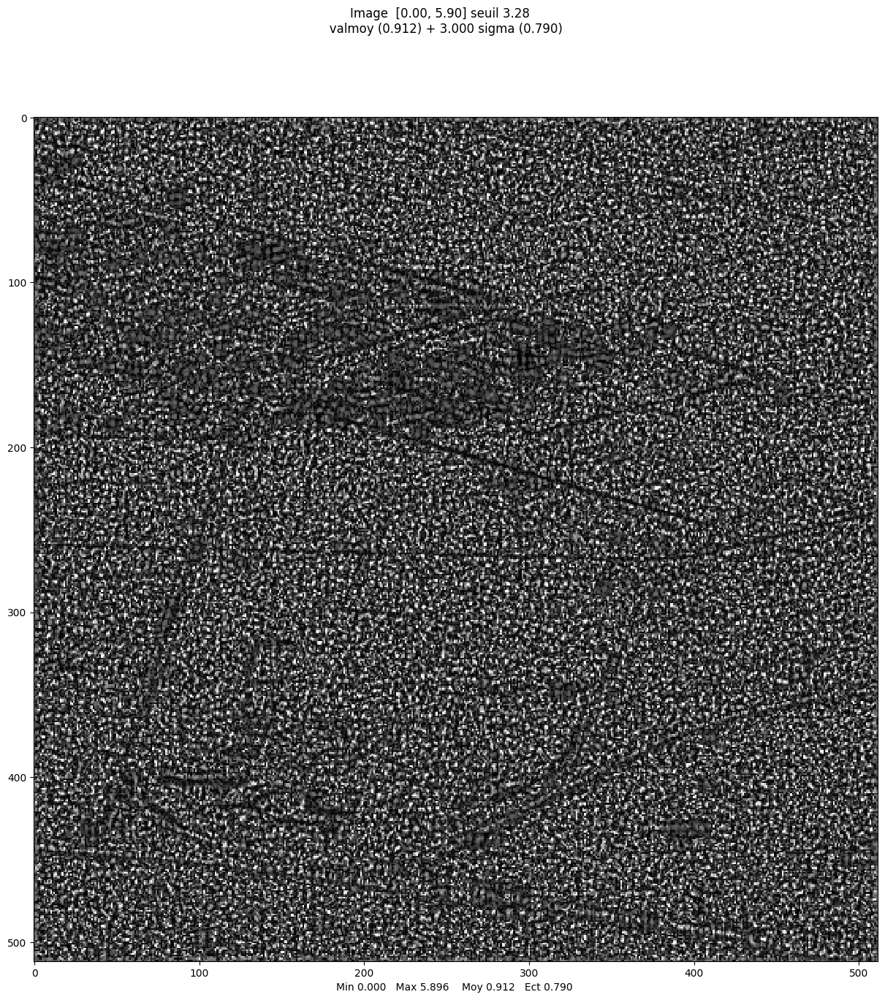

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


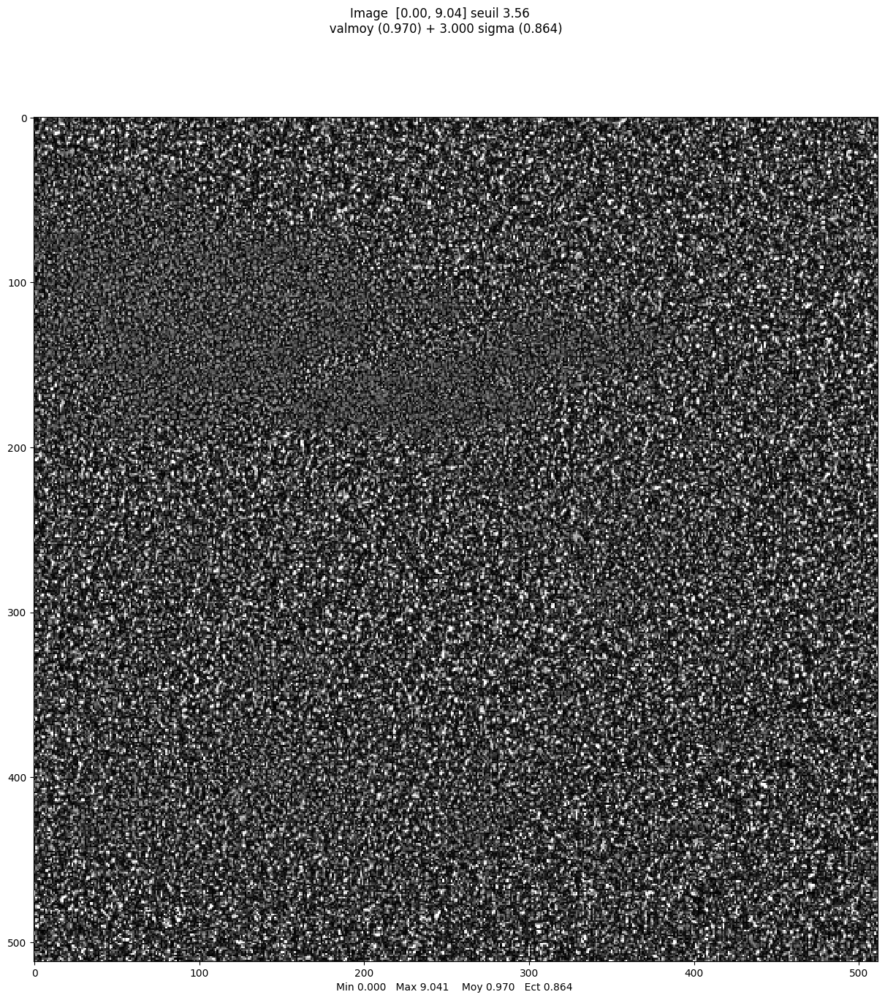

LEE FILTER: mean = 0.9124167702785171 and var = 0.6236372729695344
SAR2SAR: mean = 0.9697834638584217 and var = 0.7457658171745046


In [44]:
# Plot the residual noise
res_noise_lee = part_lely_int/lee_filtered_int #complete
mvalab.visusar(res_noise_lee)
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

res_noise_deep = part_lely_int/im1_d**2 #complete
mvalab.visusar(res_noise_deep)
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

print('LEE FILTER: mean = '+str(mean_lee)+' and var = '+str(var_lee))
print('SAR2SAR: mean = '+str(mean_deep)+' and var = '+str(var_deep))